<a href="https://colab.research.google.com/github/karioth/PredNet_tf/blob/main/prednet_showcase_notebook_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title Download Dataset
#Make sure you are running on a GPU runtime or the legacy implementation will not work.
!pip install --upgrade --no-cache-dir gdown

!gdown https://drive.google.com/uc?id=1qrY70Gyqqff72J6DCSfrq-ZsDjL_9T-O
!gdown https://drive.google.com/uc?id=1--2Od6WD6GXzzwT6iDmJWVhb2uJrNx-k

#Unzip them
!unzip /content/prednet_kitti_data.zip -d /content/kitti_data
!unzip /content/ori_model.zip #original weights from model trained by Lotter et al. 2017

  Attempting uninstall: gdown
    Found existing installation: gdown 4.7.3
    Uninstalling gdown-4.7.3:
      Successfully uninstalled gdown-4.7.3
Downloading...
From (original): https://drive.google.com/uc?id=1qrY70Gyqqff72J6DCSfrq-ZsDjL_9T-O
From (redirected): https://drive.google.com/uc?id=1qrY70Gyqqff72J6DCSfrq-ZsDjL_9T-O&confirm=t&uuid=1ad8133f-6715-457d-bd6b-f2e73374977e
To: /content/ori_model.zip
100% 154M/154M [00:02<00:00, 75.8MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1--2Od6WD6GXzzwT6iDmJWVhb2uJrNx-k
From (redirected): https://drive.google.com/uc?id=1--2Od6WD6GXzzwT6iDmJWVhb2uJrNx-k&confirm=t&uuid=bcf0722f-1223-4d5f-b5bd-4b817cd8357f
To: /content/prednet_kitti_data.zip
100% 2.06G/2.06G [00:17<00:00, 121MB/s]
Archive:  /content/prednet_kitti_data.zip
  inflating: /content/kitti_data/sources_test.hkl  
  inflating: /content/kitti_data/sources_train.hkl  
  inflating: /content/kitti_data/sources_val.hkl  
  inflating: /content/kitti_data/X_test.hkl  


In [2]:
#@title Optional: Download weights and logs from pre-trained reimplemented model if you want to skip traning
!gdown  https://drive.google.com/uc?id=1gp0ka5lg2K4XZPG9xCaUvuQ7wWlk6SEo
!unzip /content/prednet_tf.zip

Downloading...
From (original): https://drive.google.com/uc?id=1gp0ka5lg2K4XZPG9xCaUvuQ7wWlk6SEo
From (redirected): https://drive.google.com/uc?id=1gp0ka5lg2K4XZPG9xCaUvuQ7wWlk6SEo&confirm=t&uuid=d046e2f7-fae9-48c4-970e-49d5532eedfd
To: /content/prednet_tf.zip
100% 96.8M/96.8M [00:00<00:00, 109MB/s]
Archive:  /content/prednet_tf.zip
   creating: prednet_tf/
  inflating: __MACOSX/._prednet_tf   
  inflating: prednet_tf/trained_weights.ckpt.data-00000-of-00001  
  inflating: __MACOSX/prednet_tf/._trained_weights.ckpt.data-00000-of-00001  
  inflating: prednet_tf/trained_weights.ckpt.index  
  inflating: __MACOSX/prednet_tf/._trained_weights.ckpt.index  
  inflating: prednet_tf/checkpoint   
  inflating: __MACOSX/prednet_tf/._checkpoint  
   creating: prednet_tf/logs/
  inflating: __MACOSX/prednet_tf/._logs  
   creating: prednet_tf/logs/train/
  inflating: __MACOSX/prednet_tf/logs/._train  
   creating: prednet_tf/logs/validation/
  inflating: __MACOSX/prednet_tf/logs/._validation  
  in

In [3]:
# @title Set Data Directories and Clone GitHub
! git clone https://github.com/karioth/PredNet_tf

# Path to the Kitti data
DATA_DIR = '/content/kitti_data'

# Path to the original model
ORI_WEIGHTS_DIR = '/content/ori_model'

# Where reimplemented model will be saved (or was downloaded)
WEIGHTS_DIR = '/content/prednet_tf/trained_weights.ckpt'

# Define paths to tensorboard logs (to save or downloaded)
log_dir = '/content/prednet_tf/logs'

%cd /content/PredNet_tf

Cloning into 'PredNet_tf'...
remote: Enumerating objects: 441, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 441 (delta 1), reused 0 (delta 0), pack-reused 439
Receiving objects: 100% (441/441), 18.52 MiB | 45.25 MiB/s, done.
Resolving deltas: 100% (246/246), done.
/content/PredNet_tf


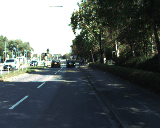

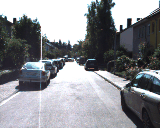

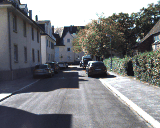

In [4]:
# @title Load and Preprocess Data
import tensorflow as tf
import tqdm
import os
import numpy as np
from data_utils import SequenceGenerator, visualize_sequence

# Data files paths
train_file = os.path.join(DATA_DIR, 'X_train.hkl')
train_sources = os.path.join(DATA_DIR, 'sources_train.hkl')
val_file = os.path.join(DATA_DIR, 'X_val.hkl')
val_sources = os.path.join(DATA_DIR, 'sources_val.hkl')

batch_size = 4
N_seq_val = 100  # Number of sequences for validation
nt = 10  # number of timesteps in the sequences

def prepare_data(dataset): # Dataset object should contain image sequences tensors with shape (nt, height, width, n_channels)

  #normalize and float32 data
  cast = lambda seq: tf.cast(seq, tf.float32)
  dataset = dataset.map(cast, num_parallel_calls=tf.data.AUTOTUNE)
  norm = lambda seq: (seq/255.)
  dataset = dataset.map(norm, num_parallel_calls=tf.data.AUTOTUNE)

  # add 0s as targets, since the goal is to minimize the output of the network during traning (weighted error) to 0.
  add_target = lambda seq: (seq, 0.0)
  dataset = dataset.map(add_target, num_parallel_calls=tf.data.AUTOTUNE)

  #shuffle batch prefetch
  dataset = dataset.shuffle(2000)
  dataset = dataset.batch(batch_size)
  dataset = dataset.prefetch(tf.data.AUTOTUNE)

  return dataset

train_ds = SequenceGenerator(train_file, train_sources, nt, shuffle = True).get_dataset()

val_ds = SequenceGenerator(val_file, val_sources, nt).get_dataset()

val_ds = val_ds.take(N_seq_val)

train_dataset = train_ds.apply(prepare_data)
val_dataset = val_ds.apply(prepare_data)


visualize_sequence(train_dataset) #visualize a few sequences

In [5]:
# @title Baseline: Evaluate Loss from Original Model
from original_prednet import load_ori_prednet, switch_to_testing

ori_model = load_ori_prednet(DIR = ORI_WEIGHTS_DIR)

ori_model.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.MeanAbsoluteError())
ori_model.summary()

val_ori = val_dataset.map(lambda x, y: (tf.transpose(x, perm=[0, 1, 4, 2, 3]), y)) #make data channels_first as expected by the original model
train_samp = train_dataset.take(50)
train_ori = train_samp.map(lambda x, y: (tf.transpose(x, perm=[0, 1, 4, 2, 3]), y))
print('\nOriginal model loss on traning dataset (to look at overfitting level):') #We are using the same split of sequences for traning both models
ori_model.evaluate(train_ori) #Make sure you are running on gpu, CPU only works with channels_last format
print('\nOriginal model val_loss:')
ori_model.evaluate(val_ori)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 10, 3, 128, 160   0         
                             )]                                  
                                                                 
 prednet_1 (PredNet)         (None, 10, 4)             6915948   
                                                                 
 timedistributed_1 (TimeDis  (None, 10, 1)             5         
 tributed)                                                       
                                                                 
 flatten_1 (Flatten)         (None, 10)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 11        
                                                                 
Total params: 6915964 (26.38 MB)
Trainable params: 6915948 

0.029744530096650124

In [6]:
#@title Model Definition
import tensorflow as tf
import tqdm
import os
import numpy as np
from model import PredNetModel

# Training parameters, matching the original
nb_epoch = 150
batch_size = 4
samples_per_epoch = 500
nt = 10
# Model hyperparam -- matching the original

im_height, im_width, n_channels = (128, 160, 3)
input_shape = (batch_size, nt, im_height, im_width, n_channels)
stack_sizes = (n_channels, 48, 96, 192)
R_stack_sizes = stack_sizes
A_filt_sizes = (1, 3, 3, 3) #first element doesnt matter, since that conv layer never gets built -- there for list comprehension simplicity.
Ahat_filt_sizes = (3, 3, 3, 3)
R_filt_sizes = (3, 3, 3, 3)
layer_loss_weights = np.array([1., 0., 0., 0.])  # error weighting for each layer in final loss; "L_0" model:  [1, 0, 0, 0], "L_all": [1, 0.1, 0.1, 0.1] i.e, we only care about minimizing error at the bottom where the next frame gets predicted
layer_loss_weights = np.expand_dims(layer_loss_weights, 1)
time_loss_weights = 1./ (nt - 1) * np.ones((nt,1))  # equally weight the error of all timesteps except the first
time_loss_weights[0] = 0
steps_per_epoch = samples_per_epoch // batch_size

#Define and build model. Using compile() to add flexibility of optimizer/loss to use. We are sticking with the originals for fair comparison.
prednet = PredNetModel(stack_sizes = stack_sizes, R_stack_sizes = R_stack_sizes, A_filt_sizes = A_filt_sizes, Ahat_filt_sizes = Ahat_filt_sizes, R_filt_sizes = R_filt_sizes,layer_loss_weights = layer_loss_weights, time_loss_weights= time_loss_weights)
prednet.build(input_shape)
prednet.summary()
prednet.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.MeanAbsoluteError()) #Using model.compile for extra flexibility

print('\nReimplementation has slightly more parameters, likely due to using ConvLSTM2Dcell object instead of handcoding it')



Model: "pred_net_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 pred_net__cell (PredNet_Ce  multiple                  6576      
 ll)                                                             
                                                                 
 pred_net__cell_1 (PredNet_  multiple                  521280    
 Cell)                                                           
                                                                 
 pred_net__cell_2 (PredNet_  multiple                  2157120   
 Cell)                                                           
                                                                 
 pred_net__cell_3 (PredNet_  multiple                  5973120   
 Cell)                                                           
                                                                 
 time_distributed (TimeDist  multiple               

In [ ]:
# @title Model Traning (Skip if you downloaded pretrained weights)
# Its pretty intensive, so A100 or V100 gpu's are recomended if running on collab.
save = True

lr_schedule = lambda epoch: 0.001 if epoch < 75 else 0.0001
callbacks = [tf.keras.callbacks.LearningRateScheduler(lr_schedule)]
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir)
callbacks.append(tensorboard_callback)

if save:
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = WEIGHTS_DIR,
        monitor='val_loss',
        verbose=0,
        save_best_only=True,
        save_weights_only=True,
        mode='auto',
        save_freq='epoch',
        initial_value_threshold=0.03
    )
    callbacks.append(model_checkpoint_callback)

# Using model.fit() instead of custom loop because results were identical so opted for matching the original. The train_step() and test_step() used by fit() are still overriden, so its easy to switch to custom loop if needed.
h = prednet.fit(x = train_dataset, validation_data = val_dataset, epochs = nb_epoch, steps_per_epoch = 125, callbacks = callbacks)

Epoch 1/150
125/125 [==============================] - 37s 180ms/step - loss: 0.0588 - val_loss: 0.0478 - lr: 0.0010
Epoch 2/150
125/125 [==============================] - 22s 172ms/step - loss: 0.0378 - val_loss: 0.0455 - lr: 0.0010
Epoch 3/150
125/125 [==============================] - 22s 173ms/step - loss: 0.0364 - val_loss: 0.0428 - lr: 0.0010
Epoch 4/150
125/125 [==============================] - 22s 172ms/step - loss: 0.0334 - val_loss: 0.0406 - lr: 0.0010
Epoch 5/150
125/125 [==============================] - 21s 172ms/step - loss: 0.0324 - val_loss: 0.0386 - lr: 0.0010
Epoch 6/150
125/125 [==============================] - 21s 172ms/step - loss: 0.0300 - val_loss: 0.0374 - lr: 0.0010
Epoch 7/150
125/125 [==============================] - 22s 173ms/step - loss: 0.0296 - val_loss: 0.0365 - lr: 0.0010
Epoch 8/150
125/125 [==============================] - 21s 172ms/step - loss: 0.0290 - val_loss: 0.0360 - lr: 0.0010
Epoch 9/150
125/125 [==============================] - 22s 172ms

In [7]:
#@title Load best (or downloaded) weights:
prednet.load_weights(WEIGHTS_DIR)

print('Model loss on traning dataset') #check it was loaded properly
prednet.evaluate(train_samp)
print('\nModel val_loss')
prednet.evaluate(val_dataset)
print('\nBoth traning and validation loss are pretty much identical to the original implementation')

Model loss on traning dataset
50/50 [==============================] - 15s 225ms/step - loss: 0.0222

Model val_loss
25/25 [==============================] - 6s 227ms/step - loss: 0.0296

Both traning and validation loss are pretty much identical to the original implementation


In [8]:
#@title Load tensorboard to visualize loss during traning
%load_ext tensorboard
%tensorboard --logdir /content/prednet_tf/logs

<IPython.core.display.Javascript object>

9/9 [==============================] - 4s 357ms/step
Previous Frame MSE: 0.021246
Model MSE: 0.006948
Original Model MSE: 0.006995
Actual


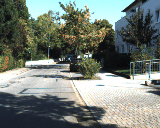


Predicted


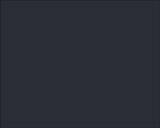


Predicted_Original


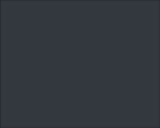

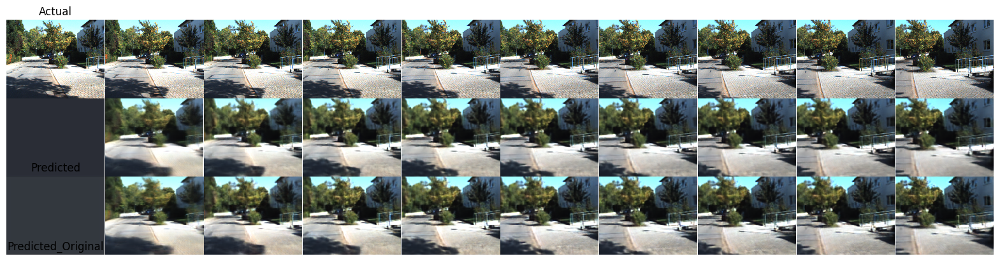

Actual


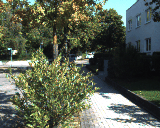


Predicted


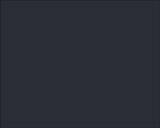


Predicted_Original


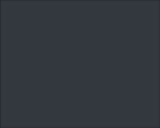

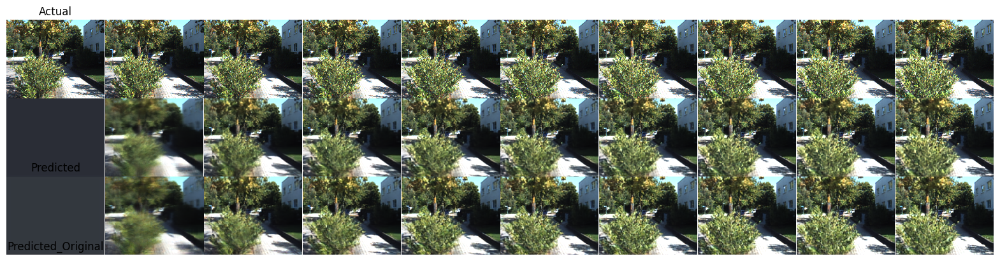

Actual


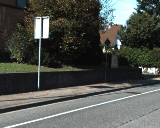


Predicted


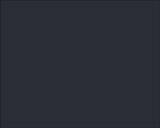


Predicted_Original


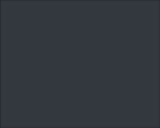

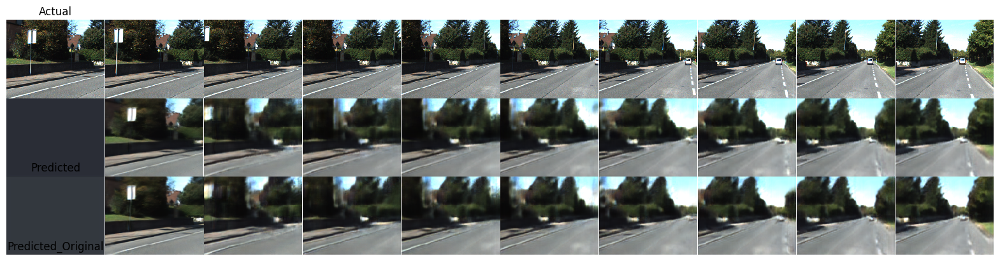

In [10]:
# @title Model Evaluation
from data_utils import compare_sequences
from original_prednet import switch_to_testing
import os
%matplotlib inline


batch_size = 10
test_file = os.path.join(DATA_DIR, 'X_test.hkl')
test_sources = os.path.join(DATA_DIR, 'sources_test.hkl')

pred_ori_model = switch_to_testing(ori_model, input_shape = [10,3,128,160]) # get a prediction version of the original model for comparison

# Create an instance of SequenceGenerator for the test data
X_test = SequenceGenerator(test_file, test_sources, nt, sequence_start_mode='unique').create_all()
X_test_ori = np.transpose(X_test, (0, 1, 4, 2, 3)) # transpose for the original model


X_hat = prednet.predict(X_test, batch_size) #get predictions

X_hat_ori = pred_ori_model.predict(X_test_ori, batch_size)
X_hat_ori = np.transpose(X_hat_ori,(0, 1, 3, 4, 2)) #transpose back for plotting.

compare_sequences(X_test, X_hat, X_hat_ori, save_results=None, gif=False, mse=True, n_sequences=3)